Conducting EDA on US top charting songs from 1921- 2020 to examine relationship between variables and other patterns in the data.

# Exploratory Data Analysis (EDA)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.graph_objects as go

from scipy.stats import pearsonr
from sklearn.feature_extraction.text import CountVectorizer

# shows plots inline
%matplotlib inline

In [2]:
df=pd.read_csv('/Users/sayalinagarkar/Documents/Sayali/INFO-6105/Project/US_1921-2021_final.csv');

In [3]:
df.head()

,popularity,duration_ms,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0.06,126903,1922,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,0.00,98200,1922,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,0.00,181640,1922,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,0.00,176907,1922,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,0.00,163080,1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 587927 entries, 0 to 587926
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        587927 non-null  float64
 1   duration_ms       587927 non-null  int64  
 2   year              587927 non-null  int64  
 3   danceability      587927 non-null  float64
 4   energy            587927 non-null  float64
 5   key               587927 non-null  int64  
 6   loudness          587927 non-null  float64
 7   mode              587927 non-null  int64  
 8   speechiness       587927 non-null  float64
 9   acousticness      587927 non-null  float64
 10  instrumentalness  587927 non-null  float64
 11  liveness          587927 non-null  float64
 12  valence           587927 non-null  float64
 13  tempo             587927 non-null  float64
 14  time_signature    587927 non-null  int64  
dtypes: float64(10), int64(5)
memory usage: 67.3 MB


# Spotify Audio Features

Spotify provides breaks down its track data using its audio features. The Spotify Web API developer guide defines them as follows:

Duration: The duration of the track in milliseconds.

Danceability: Describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.

Energy: Represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale.
Key: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.

Loudness: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks.

Mode: Indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived.
Major is represented by 1 and minor is 0.

Speechiness: This detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value.

Acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic.

Instrumentalness: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”.

Liveness: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.

Valence: Describes the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

Tempo: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece, and derives directly from the average beat duration.

Time signature: An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

Firstly, let's convert duration from ms to seconds for simplicity.

In [6]:
def convert_mstosec(ms_input):
    sec_output= ms_input/1000
    return sec_output

In [7]:
df['duration']= df['duration_ms'].apply(lambda x: convert_mstosec(x))

In [8]:
df['duration']

0         126.903
1          98.200
2         181.640
3         176.907
4         163.080
           ...   
587922    185.487
587923    214.707
587924    215.627
587925    199.112
587926    149.190
Name: duration, Length: 587927, dtype: float64

In [9]:
df.drop('duration_ms', axis=1, inplace=True)

In [10]:
df_final= df
df_final.head()

,popularity,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,0.06,1922,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3,126.903
1,0.00,1922,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1,98.200
2,0.00,1922,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5,181.640
3,0.00,1922,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3,176.907
4,0.00,1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4,163.080


# Categorical features

There are two categorical features in this datasets: key and mode.

In [11]:
df_categorical=df_final[['key','mode']].copy()

In [12]:
df_categorical.head()

,key,mode
0,0,1
1,0,1
2,1,1
3,7,1
4,3,0


Keys are denoted as numbers. 0 represents C, and each index represents a semitone increase in key. Musical mode is also denoted as integers, but it is a binary data that indicates whether the song is a major/ minor key. 0 represents minor keys, while 1 represents major.

Values will be replaced to reflect corresponding categories.

In [13]:
df_final['key'].replace({0:'C',1:'C#', 2:'D', 3:'D#', 4:'E', 5:'F', 6:'F#',7:'G',8:'Ab', 9:'A', 10:'Bb',11:'B'}, inplace=True)
df_final['mode'].replace({0:'minor',1:'major'}, inplace=True)


df_categorical['key'].replace({0:'C',1:'C#', 2:'D', 3:'D#', 4:'E', 5:'F', 6:'F#',7:'G',8:'Ab', 9:'A', 10:'Bb',11:'B'}, inplace=True)
df_categorical['mode'].replace({0:'minor',1:'major'}, inplace=True)

In [14]:
df_categorical['key'].value_counts()

C     75105
G     73841
D     66625
A     65184
F     53666
E     48331
C#    41928
B     39261
Bb    37757
Ab    33621
F#    30992
D#    21616
Name: key, dtype: int64

In [15]:
key_order= ['C','C#','D','D#', 'E', 'F','F#','G', 'Ab','A','Bb','B' ]

<AxesSubplot:xlabel='key', ylabel='count'>

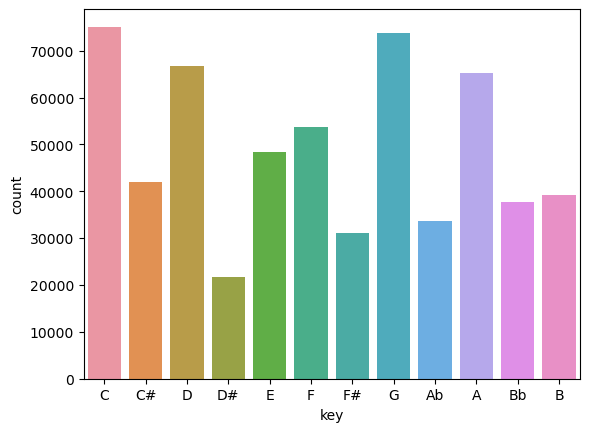

In [17]:
sns.countplot(data=df_categorical, order= key_order,x='key')

The most common keys are C and G.

In [18]:
df_categorical['mode'].value_counts()

major    387277
minor    200650
Name: mode, dtype: int64

<AxesSubplot:xlabel='mode', ylabel='count'>

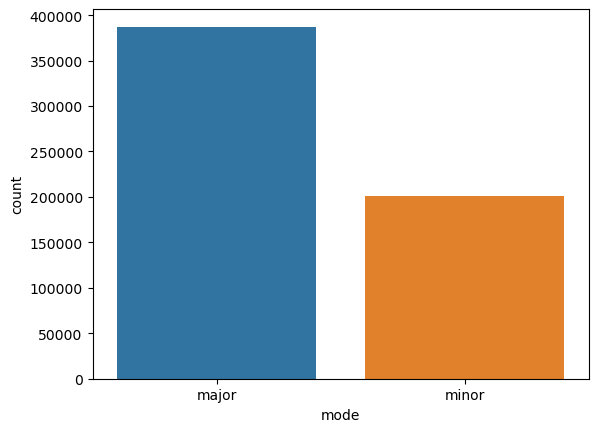

In [19]:
sns.countplot(data= df_categorical, x='mode')

There are more songs that are in major mode.

# Numerical Features

We will now conduct analysis on numerical features of the dataset.

In [20]:
# Filtering numerical data.
cat_columns= df_categorical.columns
df_numerical= df_final.drop(cat_columns, axis=1)

In [21]:
df_numerical.columns

Index(['popularity', 'year', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'duration'],
      dtype='object')

In [22]:
df_numerical.describe()

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
count,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000,587927.000000
mean,0.276178,1988.635402,0.563848,0.542221,-10.197473,0.104846,0.449440,0.113214,0.213865,0.552231,118.480327,3.873574,229.985076
std,0.184284,22.855973,0.166123,0.251788,5.088175,0.179736,0.348759,0.266634,0.184246,0.257637,29.768571,0.472759,126.412020
min,0.000000,1900.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.344000
25%,0.130000,1974.000000,0.453000,0.344000,-12.881000,0.034000,0.096700,0.000000,0.098200,0.346000,95.610000,4.000000,175.067000
50%,0.270000,1992.000000,0.578000,0.549000,-9.232000,0.044300,0.421000,0.000024,0.139000,0.564000,117.398000,4.000000,214.831000
75%,0.410000,2007.000000,0.686000,0.748000,-6.474000,0.076500,0.784000,0.009430,0.278000,0.769000,136.351000,4.000000,263.760000
max,1.000000,2021.000000,0.991000,1.000000,5.376000,0.971000,0.996000,1.000000,1.000000,1.000000,246.381000,5.000000,5621.218000


The min value of year in 1900. So our data starts from 1900. 

In [23]:
df_1900= df_numerical[df_numerical['year']==1900]
df_1900.head()

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
478627,0.19,1900,0.659,0.791,-4.895,0.0295,0.139,0.000002,0.161,0.956,141.999,4,233.92


In [24]:
df_numerical.sort_values('popularity', ascending=False)

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
93802,1.000000,2021,0.677,0.696,-6.181,0.1190,0.3210,0.000000,0.4200,0.4640,90.030,4,198.082
586672,0.999203,2021,0.604,0.366,-7.519,0.0282,0.5780,0.000000,0.1330,0.1300,141.981,4,224.695
586673,0.998406,2021,0.591,0.764,-5.484,0.0483,0.0383,0.000000,0.1030,0.4780,169.928,4,141.806
586674,0.997610,2021,0.736,0.704,-7.409,0.0615,0.0203,0.000000,0.0501,0.8940,149.995,4,212.000
586675,0.996813,2021,0.761,0.525,-6.900,0.0944,0.4400,0.000007,0.0921,0.5310,80.870,4,238.805
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132583,0.000000,1924,0.787,0.340,-9.113,0.0796,0.9590,0.075900,0.2360,0.8120,109.139,4,177.890
132582,0.000000,1924,0.270,0.228,-19.269,0.0601,0.9920,0.925000,0.2780,0.4970,188.105,4,166.631
132581,0.000000,1924,0.638,0.570,-5.116,0.0331,0.9960,0.192000,0.2930,0.7290,106.267,4,188.783
132580,0.000000,1924,0.646,0.508,-3.748,0.0284,0.9500,0.067100,0.0640,0.6780,102.941,4,194.164


Let's first observe how different audio features changed throughout time.

# Audio Features Throughout Time

In [25]:
num_features=df_numerical.columns.tolist()

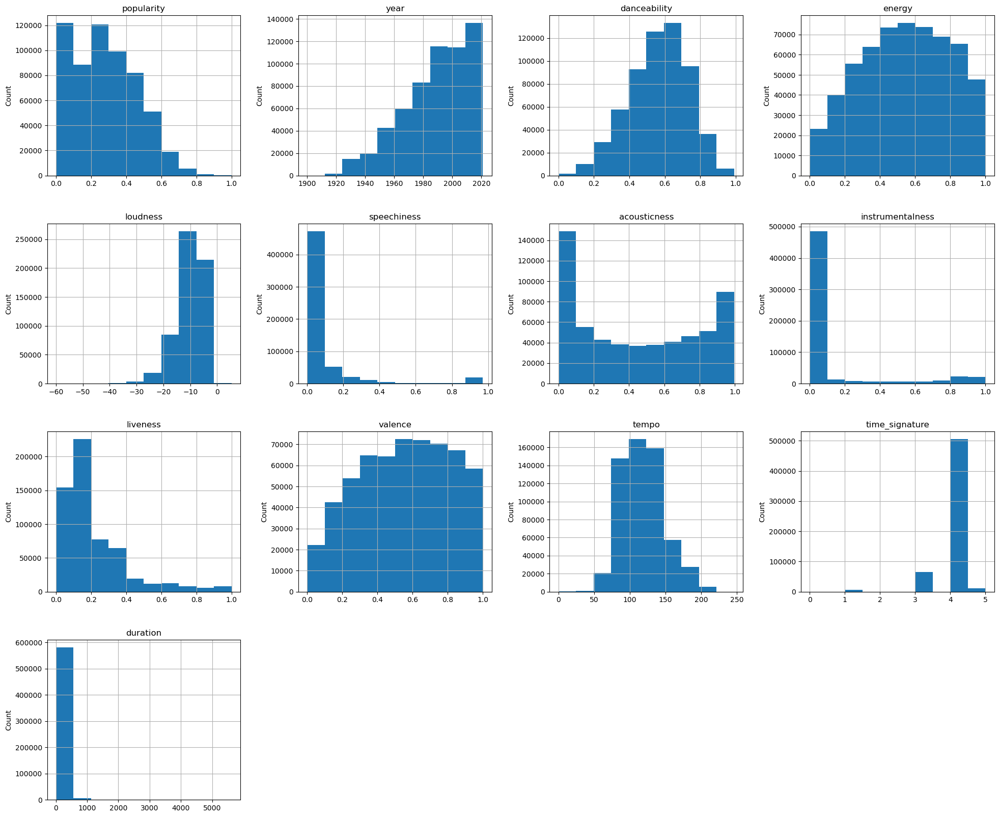

In [26]:
hist= df_numerical.hist(bins=10, figsize=(24,20))
for i, ax in enumerate(hist.ravel()):
    ax.set_ylabel('Count')

## Outlier Detection

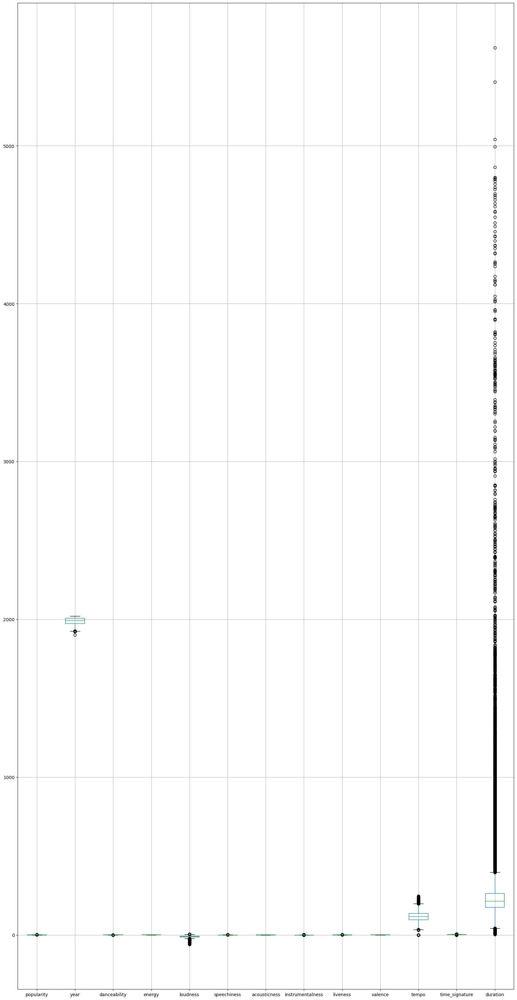

In [27]:
plt.figure(figsize=(20, 40))
df_boxplot = df_numerical.boxplot(column  = ['popularity','year','danceability', 'energy', 'loudness', 'speechiness','acousticness', 'instrumentalness','liveness','valence','tempo', 'time_signature', 'duration'])
df_boxplot.plot()
plt.show()

We can see outliers in some features. We will plot their boxplot to see if they really have outliers

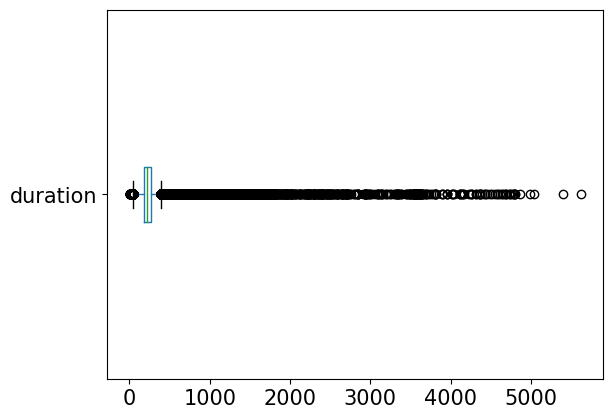

In [28]:
boxplot_dur= df_numerical.boxplot(column='duration', grid=False, vert=False, fontsize=15)

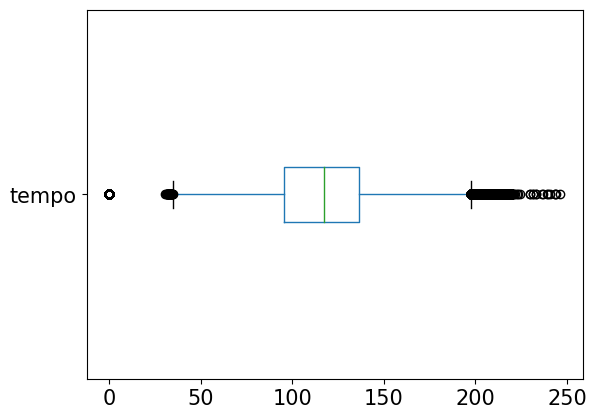

In [29]:
boxplot_tempo= df_numerical.boxplot(column='tempo', grid=False, vert=False, fontsize=15)

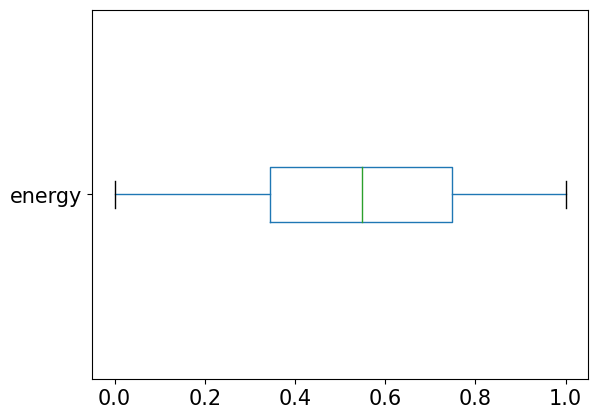

In [30]:
boxpolot_E= df_numerical.boxplot(column='energy', grid=False, vert=False, fontsize=15)

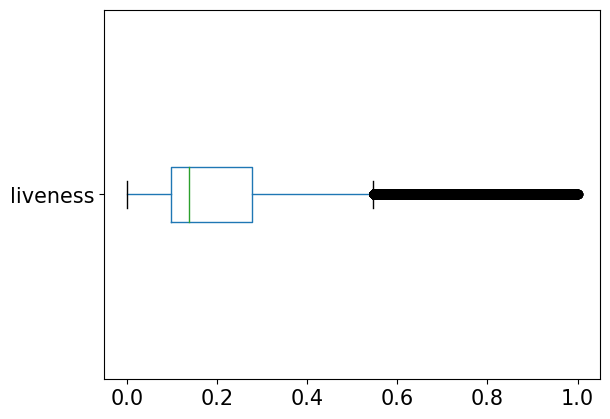

In [31]:
boxpolot_live= df_numerical.boxplot(column='liveness', grid=False, vert=False, fontsize=15)

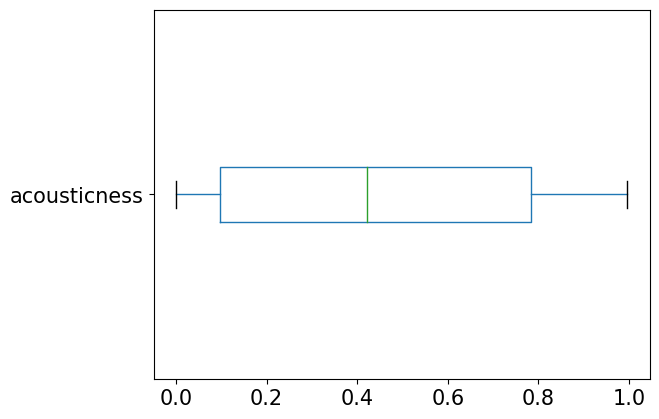

In [32]:
boxpolot_acoust= df_numerical.boxplot(column='acousticness', grid=False, vert=False, fontsize=15)

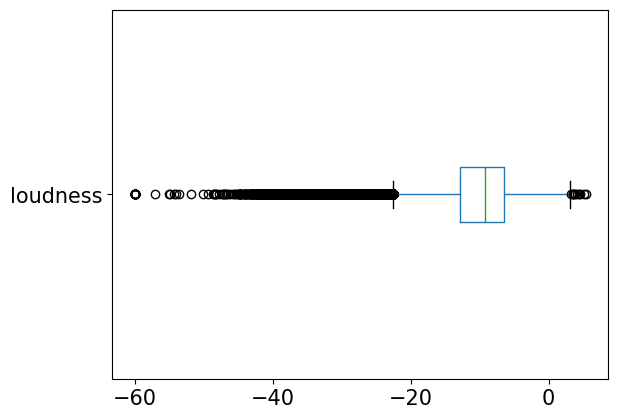

In [33]:
boxpolot_loud= df_numerical.boxplot(column='loudness', grid=False, vert=False, fontsize=15)

We will now plot graph for each of these feature to see their trend throughout years

In [34]:
audio_features= [x for x in num_features if x not in ['popularity','year','loudness','speechiness','tempo','time_signature', 'duration']]

In [35]:
audio_features

['danceability',
 'energy',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence']

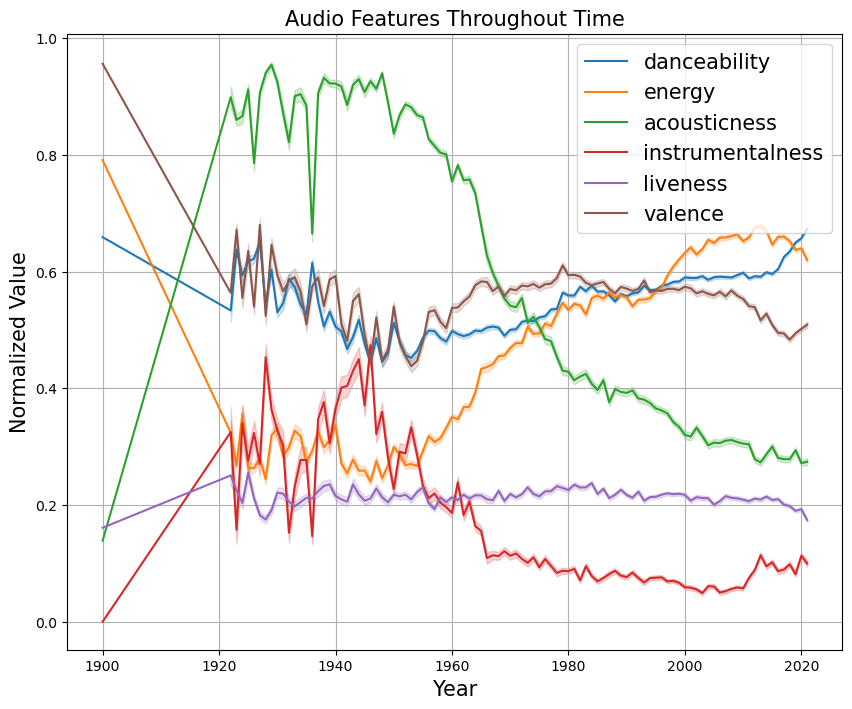

In [80]:
plt.figure(figsize=(10,8))

for i in audio_features:
    sns.lineplot(data=df_numerical, x='year', y=i, label= str(i))

plt.xlabel('Year', fontsize=15)    
plt.ylabel('Normalized Value', fontsize=15)
plt.title('Audio Features Throughout Time', fontsize=15)
plt.legend(loc= 'upper right', fontsize=15)
plt.grid()
plt.show()

Songs were high in acousticness around the 1920s-1950s. The acousticness started showing downward trend from then on. Valence and danceability values show close resemblance through the 1920s-1960s. They then show slight divergence, but both with upward trends until the 1990s. Valence and danceability then shows another divergence, with danceability increasing, while valence decreasing. Energy remains consistent throughout the 1920s-1950s, staying around 0.3. It then experienced constant upward trend until 2020s. Liveness stays consistent around 0.2 throughout the 1920s-2020s. Instrumentalness hovers around 0.2-0.4 between the 1920-1950, then decreases until the 1970s, then stays around 0.1 until 2020.

# Visualizing Relationships Between Features

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'year'),
  Text(0, 2.5, 'danceability'),
  Text(0, 3.5, 'energy'),
  Text(0, 4.5, 'loudness'),
  Text(0, 5.5, 'speechiness'),
  Text(0, 6.5, 'acousticness'),
  Text(0, 7.5, 'instrumentalness'),
  Text(0, 8.5, 'liveness'),
  Text(0, 9.5, 'valence'),
  Text(0, 10.5, 'tempo'),
  Text(0, 11.5, 'time_signature'),
  Text(0, 12.5, 'duration')])

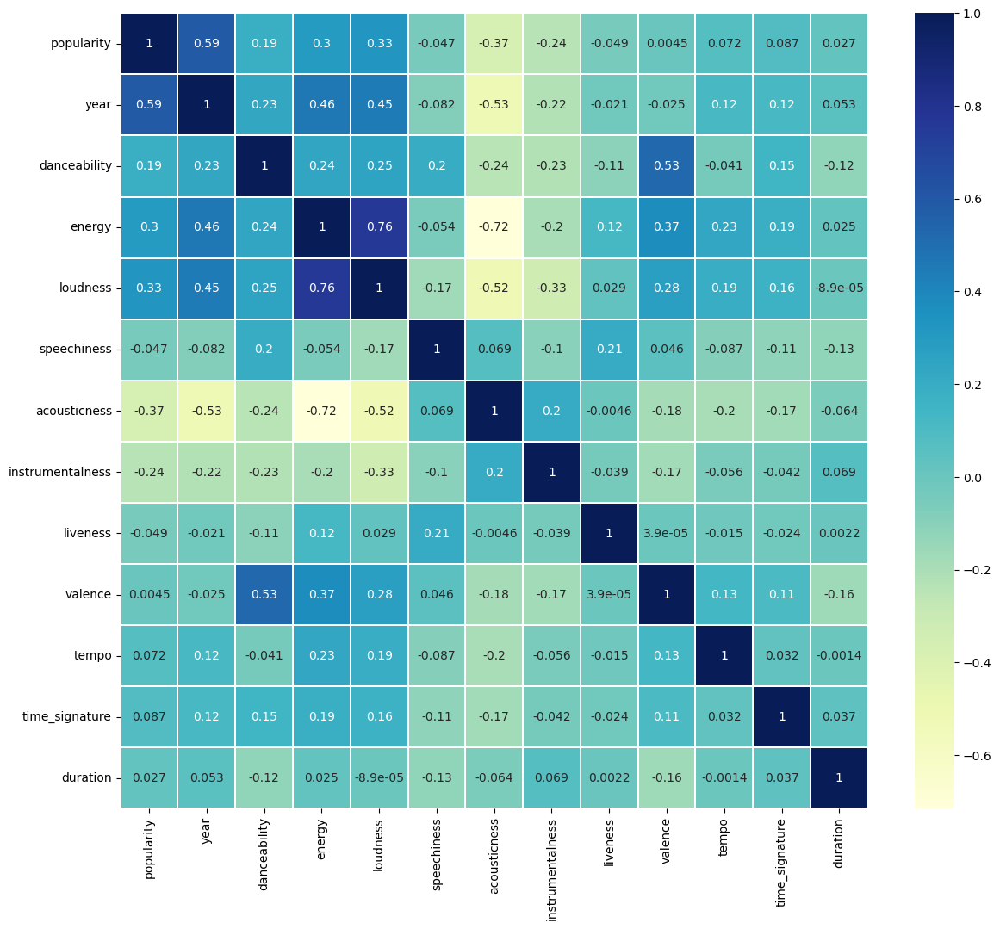

In [38]:
# Heatmap to visualize data relationships
plt.figure(figsize=(14,12))
sns.heatmap(df.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.yticks(rotation=0)

Strong positive correlations:
energy: loudness (0.76)

Moderate correlations:
valence: danceability (0.53)
valence: energy(0.37)

Strong negative correaltions:
energy: acousticness (-0.72)

Moderate negative correlations:
loudness: acousticness (-0.52)
acousticness: popularity (-0.37)

We tried breaking down the data by year.

In [39]:
year_list= df_numerical['year'].unique().tolist()
year_list.sort()

data_year=[]
for i in range(len(year_list)):
    data_year.append(df_numerical[df_numerical['year']== year_list[i]])
    print(data_year)

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ]
[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180     

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

[        popularity  year  danceability  energy  loudness  speechiness  \
478627        0.19  1900         0.659   0.791    -4.895       0.0295   

        acousticness  instrumentalness  liveness  valence    tempo  \
478627         0.139          0.000002     0.161    0.956  141.999   

        time_signature  duration  
478627               4    233.92  ,         popularity  year  danceability  energy  loudness  speechiness  \
0             0.06  1922         0.645  0.4450   -13.338       0.4510   
1             0.00  1922         0.695  0.2630   -22.136       0.9570   
2             0.00  1922         0.434  0.1770   -21.180       0.0512   
3             0.00  1922         0.321  0.0946   -27.961       0.0504   
4             0.00  1922         0.402  0.1580   -16.900       0.0390   
...            ...   ...           ...     ...       ...          ...   
511006        0.00  1922         0.574  0.2830   -12.847       0.0622   
511007        0.00  1922         0.426  0.2850   -11.970

The earliest data we have is from 1900. While one may expect music from 1900 to be significantly different from 1922, let's examine it.

/Users/sayalinagarkar/opt/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:198: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/Users/sayalinagarkar/opt/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:203: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'danceability'),
  Text(0, 2.5, 'energy'),
  Text(0, 3.5, 'loudness'),
  Text(0, 4.5, 'speechiness'),
  Text(0, 5.5, 'acousticness'),
  Text(0, 6.5, 'instrumentalness'),
  Text(0, 7.5, 'liveness'),
  Text(0, 8.5, 'valence'),
  Text(0, 9.5, 'tempo'),
  Text(0, 10.5, 'time_signature'),
  Text(0, 11.5, 'duration')])

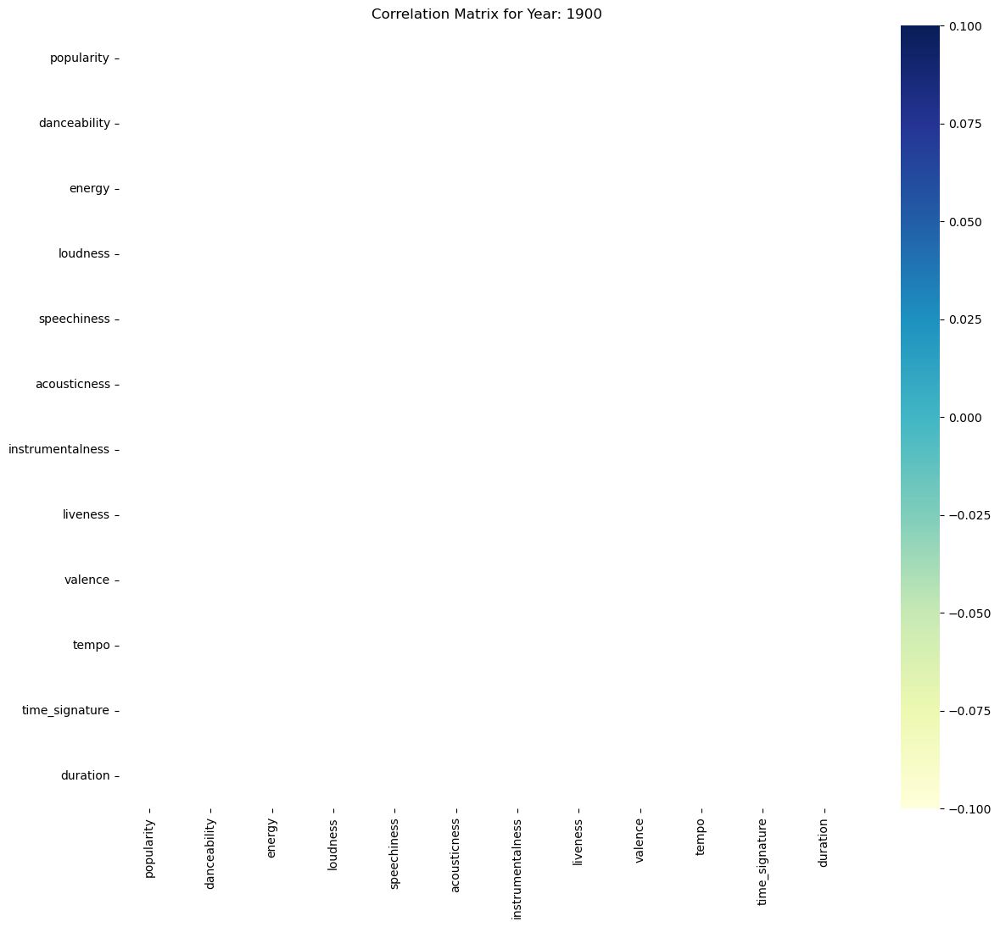

In [40]:
# Heatmap to visualize data relationships
df_noyear=data_year[0].drop('year', axis=1)
plt.figure(figsize=(14,12))
sns.heatmap(df_noyear.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.title(label=f"Correlation Matrix for Year: {year_list[0]}")
plt.yticks(rotation=0)

We only have one song from 1900. Onto the next year!

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'danceability'),
  Text(0, 2.5, 'energy'),
  Text(0, 3.5, 'loudness'),
  Text(0, 4.5, 'speechiness'),
  Text(0, 5.5, 'acousticness'),
  Text(0, 6.5, 'instrumentalness'),
  Text(0, 7.5, 'liveness'),
  Text(0, 8.5, 'valence'),
  Text(0, 9.5, 'tempo'),
  Text(0, 10.5, 'time_signature'),
  Text(0, 11.5, 'duration')])

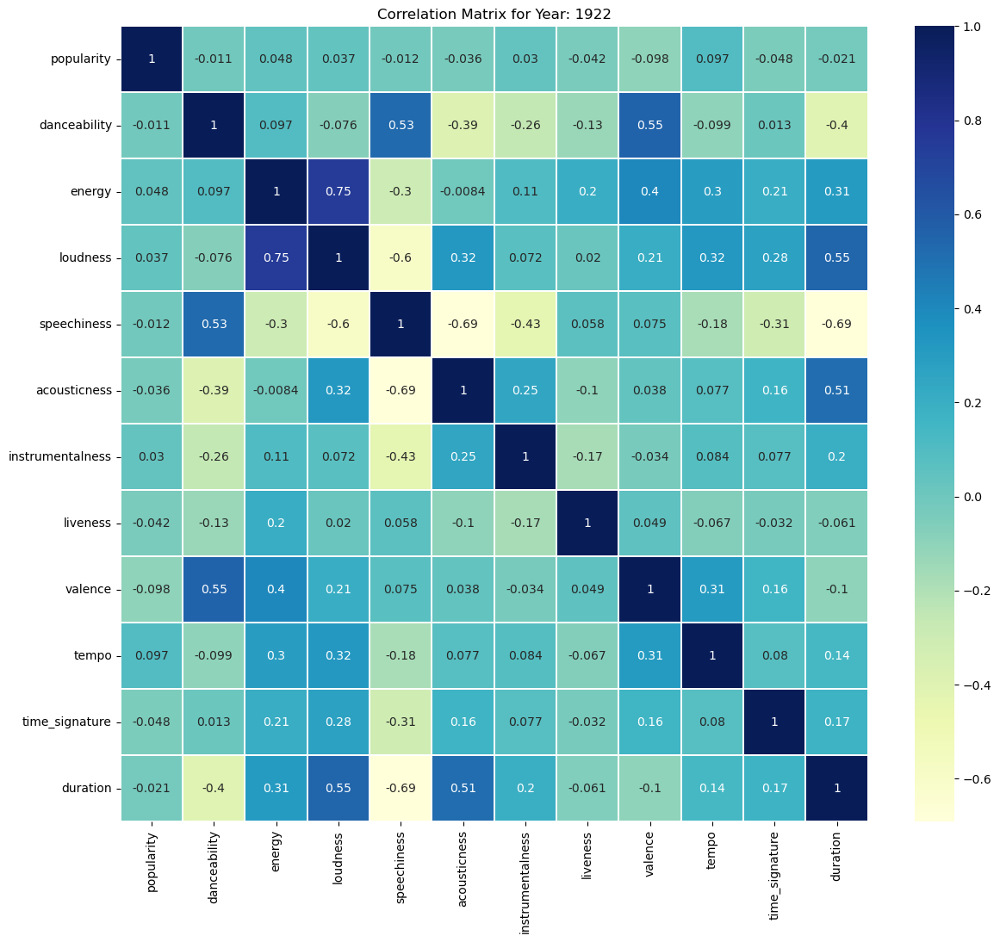

In [41]:
# Heatmap to visualize data relationships
df_noyear=data_year[1].drop('year', axis=1)

plt.figure(figsize=(14,12))
sns.heatmap(df_noyear.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.title(label=f"Correlation Matrix for Year: {year_list[1]}")
plt.yticks(rotation=0)

While it is nice to be able to visualize correlations, it will be a bit much to do so for 101 years of data. We can simply extract features, correlation values, and year.

In [42]:
df_corr_raw= pd.DataFrame(columns=['year','feature_1', 'feature_2', 'corr_value'])

for year in range(len(data_year)):

    corr_mat= data_year[year].corr()
    df_stack = corr_mat.stack().reset_index()
    print (df_stack)
    
    #set column names
    df_stack.columns=['feature_1', 'feature_2', 'corr_value']
    df_stack.drop_duplicates(inplace=True)
    
    # Year
    df_stack['year']=year_list[year]
    
    df_corr_raw= df_corr_raw.append(df_stack)
    

df_corr_raw.reset_index()

Empty DataFrame
Columns: [level_0, level_1, 0]
Index: []
        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability -0.011062
2    popularity          energy  0.047754
3    popularity        loudness  0.037055
4    popularity     speechiness -0.011578
..          ...             ...       ...
139    duration        liveness -0.061487
140    duration         valence -0.100513
141    duration           tempo  0.137914
142    duration  time_signature  0.168222
143    duration        duration  1.000000

[144 rows x 3 columns]
        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability -0.036498
2    popularity          energy -0.217212
3    popularity        loudness  0.275576
4    popularity     speechiness -0.358764
..          ...             ...       ...
139    duration        liveness  0.039260
140    duration         valence -0.195658
141    duration           tempo  0.18

/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df

        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability  0.026902
2    popularity          energy  0.029809
3    popularity        loudness  0.063495
4    popularity     speechiness -0.127278
..          ...             ...       ...
139    duration        liveness  0.153122
140    duration         valence -0.187088
141    duration           tempo -0.043809
142    duration  time_signature  0.003766
143    duration        duration  1.000000

[144 rows x 3 columns]
        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability  0.058352
2    popularity          energy  0.003764
3    popularity        loudness -0.015040
4    popularity     speechiness -0.103744
..          ...             ...       ...
139    duration        liveness  0.112356
140    duration         valence -0.216677
141    duration           tempo -0.062265
142    duration  time_signature  0.024826
143    dur

/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df

        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability -0.000415
2    popularity          energy  0.101415
3    popularity        loudness  0.035449
4    popularity     speechiness -0.003393
..          ...             ...       ...
139    duration        liveness -0.150702
140    duration         valence -0.073673
141    duration           tempo  0.080200
142    duration  time_signature  0.127157
143    duration        duration  1.000000

[144 rows x 3 columns]
        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability  0.061073
2    popularity          energy  0.104811
3    popularity        loudness  0.003122
4    popularity     speechiness  0.014171
..          ...             ...       ...
139    duration        liveness -0.123902
140    duration         valence -0.107192
141    duration           tempo  0.058309
142    duration  time_signature  0.099585
143    dur

/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df

        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability  0.032332
2    popularity          energy  0.011420
3    popularity        loudness  0.094374
4    popularity     speechiness  0.039864
..          ...             ...       ...
139    duration        liveness -0.037812
140    duration         valence -0.194132
141    duration           tempo -0.029839
142    duration  time_signature  0.029290
143    duration        duration  1.000000

[144 rows x 3 columns]
        level_0         level_1         0
0    popularity      popularity  1.000000
1    popularity    danceability  0.055625
2    popularity          energy  0.065449
3    popularity        loudness  0.151624
4    popularity     speechiness  0.003095
..          ...             ...       ...
139    duration        liveness  0.017662
140    duration         valence -0.199760
141    duration           tempo -0.043671
142    duration  time_signature  0.003299
143    dur

/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_corr_raw= df_corr_raw.append(df_stack)
/var/folders/m6/stmkb2b53fl5wg411y7h4kxr0000gn/T/ipykernel_70016/1785523949.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df

,index,year,feature_1,feature_2,corr_value
0,0,1922,popularity,popularity,1.000000
1,1,1922,popularity,danceability,-0.011062
2,2,1922,popularity,energy,0.047754
3,3,1922,popularity,loudness,0.037055
4,4,1922,popularity,speechiness,-0.011578
...,...,...,...,...,...
14395,139,2021,duration,liveness,0.009641
14396,140,2021,duration,valence,-0.068924
14397,141,2021,duration,tempo,-0.019152
14398,142,2021,duration,time_signature,0.028479


In [43]:
df_raw_sorted= df_corr_raw.sort_values(['year','feature_1','feature_2']).reset_index().drop('index', axis=1)

# Will be vectorizing years and two features
pre_count= df_raw_sorted.copy()
pre_count['yr_str']=pre_count['year'].map(str)
pre_count['yr_feat_concat']= pre_count[['yr_str','feature_1','feature_2']].apply(" ".join, axis=1)

count_vect= CountVectorizer()
frq= pd.DataFrame(count_vect.fit_transform(pre_count['yr_feat_concat']))
pre_count['frq']= frq
pre_count['frq']=pre_count['frq'].map(str)

print ("pre_count=", pre_count)
df_counted= pre_count.drop_duplicates(subset='frq', keep='first')
print ("df_counted=", df_counted)

pre_count=        year     feature_1         feature_2  corr_value yr_str  \
0      1922  acousticness      acousticness    1.000000   1922   
1      1922  acousticness      danceability   -0.387384   1922   
2      1922  acousticness          duration    0.513407   1922   
3      1922  acousticness            energy   -0.008380   1922   
4      1922  acousticness  instrumentalness    0.252077   1922   
...     ...           ...               ...         ...    ...   
14395  2021       valence        popularity    0.023245   2021   
14396  2021       valence       speechiness    0.044271   2021   
14397  2021       valence             tempo    0.065022   2021   
14398  2021       valence    time_signature    0.139750   2021   
14399  2021       valence           valence    1.000000   2021   

                           yr_feat_concat  \
0          1922 acousticness acousticness   
1          1922 acousticness danceability   
2              1922 acousticness duration   
3               

In [44]:
df_counted.head()

,year,feature_1,feature_2,corr_value,yr_str,yr_feat_concat,frq
0,1922,acousticness,acousticness,1.000000,1922,1922 acousticness acousticness,"(0, 0)\t1\n (0, 100)\t2"
1,1922,acousticness,danceability,-0.387384,1922,1922 acousticness danceability,"(0, 0)\t1\n (0, 100)\t1\n (0, 101)\t1"
2,1922,acousticness,duration,0.513407,1922,1922 acousticness duration,"(0, 0)\t1\n (0, 100)\t1\n (0, 102)\t1"
3,1922,acousticness,energy,-0.008380,1922,1922 acousticness energy,"(0, 0)\t1\n (0, 100)\t1\n (0, 103)\t1"
4,1922,acousticness,instrumentalness,0.252077,1922,1922 acousticness instrumentalness,"(0, 0)\t1\n (0, 100)\t1\n (0, 104)\t1"


In [45]:
df_counted= df_counted.drop([ 'yr_str', 'yr_feat_concat',
       'frq'],axis=1)

In [46]:
corr_strength=[]
corr_value= df_counted['corr_value']

for i in corr_value:        
    # Correlation strength
    if (i>0.7)& (i !=1):
        strength= 'Strong Positive'
    elif (i <0.7) & (i>0.4):
        strength= 'Moderate Postive'
    elif (i< -0.7)& (i != -1):
        strength= 'Strong Negative'
    elif (i> -0.7) & (i< -0.4):
        strength= 'Moderate Negative'
    else:
        strength= 'Negligible'
    corr_strength.append(strength)

df_counted['corr_strength']= corr_strength

In [47]:
df_counted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7800 entries, 0 to 14399
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   year           7800 non-null   object 
 1   feature_1      7800 non-null   object 
 2   feature_2      7800 non-null   object 
 3   corr_value     7800 non-null   float64
 4   corr_strength  7800 non-null   object 
dtypes: float64(1), object(4)
memory usage: 365.6+ KB


We will drop the correlation values which are negligible.

In [48]:
df_nonneg= df_counted[df_counted['corr_strength']!='Negligible'].reset_index()
df_nonneg

,index,year,feature_1,feature_2,corr_value,corr_strength
0,2,1922,acousticness,duration,0.513407,Moderate Postive
1,8,1922,acousticness,speechiness,-0.691520,Moderate Negative
2,14,1922,danceability,duration,-0.401094,Moderate Negative
3,20,1922,danceability,speechiness,0.527206,Moderate Postive
4,23,1922,danceability,valence,0.553361,Moderate Postive
...,...,...,...,...,...,...
502,14296,2021,energy,instrumentalness,-0.429784,Moderate Negative
503,14298,2021,energy,loudness,0.771756,Strong Positive
504,14303,2021,energy,valence,0.447247,Moderate Postive
505,14310,2021,instrumentalness,loudness,-0.657347,Moderate Negative


There are only 507 entries left.

We will now show the correlation based on year.

Year 2021

In [49]:
df_21=df_nonneg[df_nonneg['year']==2021]
print(f"Total of {len(df_21)}")
df_21

Total of 8


,index,year,feature_1,feature_2,corr_value,corr_strength
499,14259,2021,acousticness,energy,-0.666967,Moderate Negative
500,14262,2021,acousticness,loudness,-0.543786,Moderate Negative
501,14279,2021,danceability,valence,0.402532,Moderate Postive
502,14296,2021,energy,instrumentalness,-0.429784,Moderate Negative
503,14298,2021,energy,loudness,0.771756,Strong Positive
504,14303,2021,energy,valence,0.447247,Moderate Postive
505,14310,2021,instrumentalness,loudness,-0.657347,Moderate Negative
506,14339,2021,loudness,valence,0.422643,Moderate Postive


Year 2020

In [50]:
df_20=df_nonneg[df_nonneg['year']==2020]
print(f"Total of {len(df_20)}")
df_20

Total of 3


,index,year,feature_1,feature_2,corr_value,corr_strength
496,14115,2020,acousticness,energy,-0.607018,Moderate Negative
497,14154,2020,energy,loudness,0.663502,Moderate Postive
498,14167,2020,instrumentalness,popularity,-0.415825,Moderate Negative


In [51]:
df_corr= df_counted[df_counted['corr_value']!=1].reset_index()

We might need 'neglibile' correlation values later. We'll keep them for now.

In [52]:
df_corr.shape

(6600, 6)

We will try to explore different combination between features and their correlation values. We will then try to explore if there is any pattern in correlation.

In [53]:
corr_feat= df_corr[['feature_1', 'feature_2']].apply(" ".join, axis=1)
df_corr['corr_feat']=corr_feat
df_corr['corr_feat']=df_corr['corr_feat'].str.title()

# Rearranging column orders
cols=['year', 'feature_1', 'feature_2', 'corr_feat','corr_value', 'corr_strength']
df_corr=df_corr[cols]

In [54]:
df_corr.head()

,year,feature_1,feature_2,corr_feat,corr_value,corr_strength
0,1922,acousticness,danceability,Acousticness Danceability,-0.387384,Negligible
1,1922,acousticness,duration,Acousticness Duration,0.513407,Moderate Postive
2,1922,acousticness,energy,Acousticness Energy,-0.008380,Negligible
3,1922,acousticness,instrumentalness,Acousticness Instrumentalness,0.252077,Negligible
4,1922,acousticness,liveness,Acousticness Liveness,-0.101824,Negligible


In [55]:
df_corr.shape

(6600, 6)

Let's make sure there isn't any different feature names that mean the same thing (i.e. acousticness vs. duration and duration vs. acousticness). While we have removed duplicate feature names before, we only did so in a single year. Let's check for duplicate feature names across different years. 

In [56]:
corr_feat_sort= df_corr['corr_feat'].unique()
corr_feat_sort.sort()

In [57]:
len(corr_feat_sort)

66

In [58]:
feat_df=pd.DataFrame(corr_feat_sort)
feat_df=feat_df.astype(str)

feat_frq= pd.DataFrame(count_vect.fit_transform(feat_df[0]))
feat_frq

,0
0,"(0, 0)\t1\n (0, 1)\t1"
1,"(0, 0)\t1\n (0, 2)\t1"
2,"(0, 0)\t1\n (0, 3)\t1"
3,"(0, 0)\t1\n (0, 4)\t1"
4,"(0, 0)\t1\n (0, 5)\t1"
...,...
61,"(0, 8)\t1\n (0, 10)\t1"
62,"(0, 8)\t1\n (0, 11)\t1"
63,"(0, 9)\t1\n (0, 10)\t1"
64,"(0, 9)\t1\n (0, 11)\t1"


There seems to be common feature correlations that exist throughout years. Let's examine data from the past 10 years and identify them. Let's try taking averages of correlation values.

In [59]:
past_ten= year_list[90:]
features=feat_df.iloc[:,0]

df_past10=df_corr.loc[df_corr['year'].isin(past_ten)]


avg_corr=pd.DataFrame(columns=['features','corrs_avg'])
corr_avg=[]


for i in range(len(features)):
    df=df_past10[df_past10['corr_feat']==features[i]]
    df=df.reset_index()
    
    corr_avg.append(df['corr_value'].mean())
        
avg_corr['corrs_avg']= corr_avg
avg_corr['features']= features

avg_corr

,features,corrs_avg
0,Acousticness Danceability,-0.168725
1,Acousticness Duration,-0.021925
2,Acousticness Energy,-0.668673
3,Acousticness Instrumentalness,-0.004336
4,Acousticness Liveness,-0.069360
...,...,...
61,Speechiness Time_Signature,0.031683
62,Speechiness Valence,0.080065
63,Tempo Time_Signature,0.045229
64,Tempo Valence,0.059266


In [60]:
avg_modstrong= avg_corr.loc[(avg_corr['corrs_avg']>0.5)|(avg_corr['corrs_avg']< -0.5)]
avg_modstrong

,features,corrs_avg
2,Acousticness Energy,-0.668673
32,Energy Loudness,0.703369


Acousticness/energy and energy/loudness pairs are also found here. This means popular songs the past ten years tend to have negative correlation between acousticness/energy and positive correlation between energy/ loudness.

Let's see if there are correlations in correlations between features and time. First we'll try to find correlations between correlations between features correlation and time throughout the entire dataset(called correlation-time correlation moving forward). We'll then focus and find correlation-time correlation* in data from the past ten years.

In [61]:
features=feat_df.iloc[:,0]
feat_time_corr=pd.DataFrame(columns=['features','corrs_across_years'])
pearson_list=[]
lessthan30=[]


for i in features:
    df=df_corr[df_corr['corr_feat']==i]
    df=df.reset_index()
    
    if len(df[df['corr_strength']!='Negligible'])<30:
        lessthan30.append(i)
    else:
        corr_mat= pearsonr(x=df['year'], y= df['corr_value'])
        pearson_list.append(corr_mat)
        
pearson_r=[a for a,b in pearson_list]
feat_time_corr['corrs_across_years']= pearson_r
feat_time_corr['features']= features

print(f"{len(lessthan30)} features have less than 30 non-negligible correlation values.")  

df_feat_filt=feat_time_corr.loc[(feat_time_corr['corrs_across_years']> 0.5) | (feat_time_corr['corrs_across_years']< -0.5)]
df_feat_filt

61 features have less than 30 non-negligible correlation values.


,features,corrs_across_years
0,Acousticness Danceability,-0.801869
1,Acousticness Duration,-0.794410


Overall, there is a strong negative correlation-time correlation in "Acousticness Danceability" and "Acousticness Duration". We'll now analyze the data the past ten years and see if we still see this features correlation after narrowing down the time frame.

In [62]:
feat_conc= df_nonneg[['feature_1', 'feature_2']].apply(" ".join, axis=1)
df_nonneg['corr_feat']=feat_conc
df_nonneg['corr_feat']=df_nonneg['corr_feat'].str.title()

# Rearranging column orders
cols=['year', 'feature_1', 'feature_2', 'corr_feat','corr_value', 'corr_strength']
df_nonneg=df_nonneg[cols]

In [63]:
past_ten= year_list[90:]
features=feat_df.iloc[:,0]

correl_str=['Strong Positive', 'Strong Negative']

df_past10=df_corr.loc[df_corr['year'].isin(past_ten)]


past_ten_corr=pd.DataFrame(columns=['features','corrs_across_years'])
pearson_list=[]
lessthan5=[]


for i in features:
    df=df_past10[df_past10['corr_feat']==i]
    df=df.reset_index()
    
    if len(df[df['corr_strength']=='Negligible'])<5:
        lessthan5.append(i)
    
    else: 
        corr_mat= pearsonr(x=df['year'], y= df['corr_value'])
        pearson_list.append(corr_mat)
        
        
pearson_r=[a for a,b in pearson_list]
past_ten_corr['corrs_across_years']= pearson_r
past_ten_corr['features']= features


df_ten_filt=past_ten_corr.loc[(past_ten_corr['corrs_across_years']> 0.5) | (past_ten_corr['corrs_across_years']< -0.5)].reset_index(drop=True)

print(f"{len(lessthan5)} features have less than 5 non-negligible correlation values.")
print(f"{len(df_ten_filt)} features have more than 5 non-negligible correlation values.")

df_ten_filt

4 features have less than 5 non-negligible correlation values.
28 features have more than 5 non-negligible correlation values.


,features,corrs_across_years
0,Acousticness Instrumentalness,-0.535020
1,Acousticness Loudness,0.803627
2,Danceability Duration,-0.833809
3,Danceability Instrumentalness,0.619052
4,Danceability Liveness,0.652125
5,Danceability Loudness,0.821518
6,Danceability Popularity,0.813221
7,Danceability Speechiness,0.676917
8,Danceability Tempo,0.774177
9,Danceability Time_Signature,-0.627642


In [64]:
df_ten_filt['colors']=['green' if x > 0 else 'red' for x in df_ten_filt.corrs_across_years]

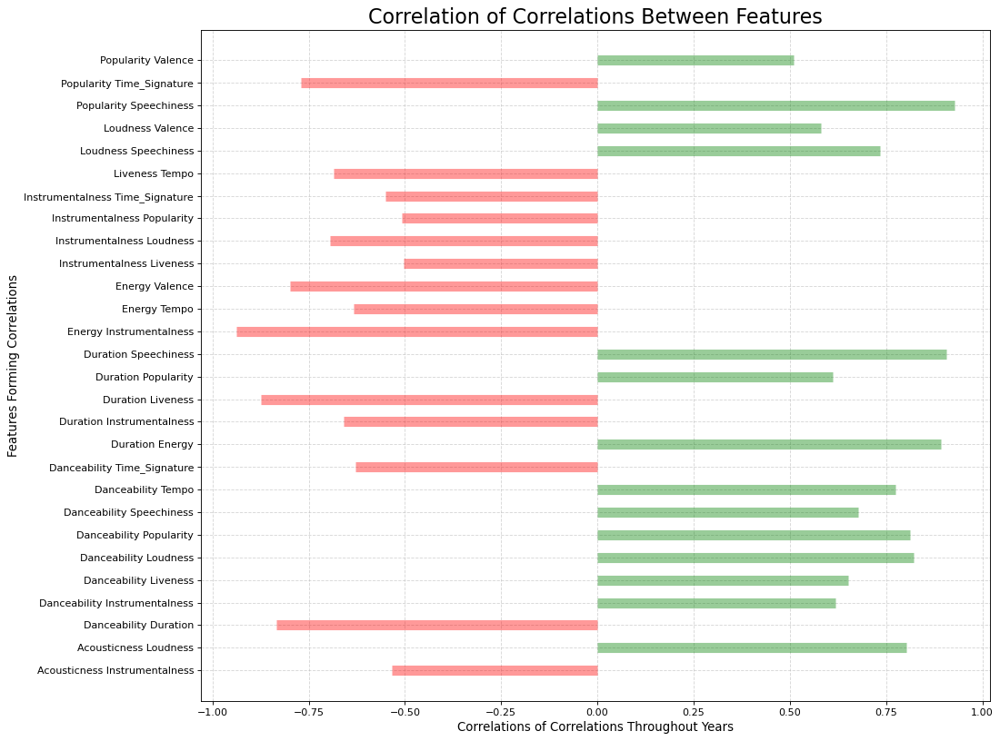

In [65]:
plt.figure(figsize=(14,12), dpi=80)
plt.hlines(y= df_ten_filt.features, xmin=0, xmax=df_ten_filt.corrs_across_years, 
           colors= df_ten_filt.colors, alpha=0.4, linewidth=10)
plt.xlabel('Correlations of Correlations Throughout Years',fontdict= {'size':12})
plt.ylabel('Features Forming Correlations', fontdict= {'size':12})
plt.title('Correlation of Correlations Between Features', fontdict= {'size':20})
plt.grid(linestyle='--', alpha=0.5)
plt.show()

Let's look at feature combinations with positive correlation with time.

In [66]:
df_ten_filt.drop(columns='colors', inplace=True)

In [67]:
df_ten_positive_mod = df_ten_filt.loc[df_ten_filt['corrs_across_years']<0.7]
df_ten_positive_mod

,features,corrs_across_years
0,Acousticness Instrumentalness,-0.535020
2,Danceability Duration,-0.833809
3,Danceability Instrumentalness,0.619052
4,Danceability Liveness,0.652125
7,Danceability Speechiness,0.676917
9,Danceability Time_Signature,-0.627642
11,Duration Instrumentalness,-0.659078
12,Duration Liveness,-0.873458
13,Duration Popularity,0.612347
15,Energy Instrumentalness,-0.937092


In [68]:
df_ten_positive= df_ten_filt.loc[df_ten_filt['corrs_across_years']>0.5]
print(len(df_ten_positive))
df_ten_positive

14


,features,corrs_across_years
1,Acousticness Loudness,0.803627
3,Danceability Instrumentalness,0.619052
4,Danceability Liveness,0.652125
5,Danceability Loudness,0.821518
6,Danceability Popularity,0.813221
7,Danceability Speechiness,0.676917
8,Danceability Tempo,0.774177
10,Duration Energy,0.891519
13,Duration Popularity,0.612347
14,Duration Speechiness,0.905806


In [69]:
df_ten_positive= df_ten_filt.loc[df_ten_filt['corrs_across_years']>0.7]
print(len(df_ten_positive))
df_ten_positive

8


,features,corrs_across_years
1,Acousticness Loudness,0.803627
5,Danceability Loudness,0.821518
6,Danceability Popularity,0.813221
8,Danceability Tempo,0.774177
10,Duration Energy,0.891519
14,Duration Speechiness,0.905806
23,Loudness Speechiness,0.734679
25,Popularity Speechiness,0.926762


Let's look at feature combinations with negative correlation with time.

In [70]:
corr_feat_sort= df_corr['corr_feat'].unique()
corr_feat_sort.sort()
len(corr_feat_sort)

66

In [71]:
df_ten_neg= df_ten_filt.loc[df_ten_filt['corrs_across_years']<-0.5]
print(len(df_ten_neg))
df_ten_neg

14


,features,corrs_across_years
0,Acousticness Instrumentalness,-0.535020
2,Danceability Duration,-0.833809
9,Danceability Time_Signature,-0.627642
11,Duration Instrumentalness,-0.659078
12,Duration Liveness,-0.873458
15,Energy Instrumentalness,-0.937092
16,Energy Tempo,-0.633460
17,Energy Valence,-0.798077
18,Instrumentalness Liveness,-0.503114
19,Instrumentalness Loudness,-0.695271


In [72]:
df_ten_neg= df_ten_filt.loc[df_ten_filt['corrs_across_years']<-0.7]
print(len(df_ten_neg))
df_ten_neg

5


,features,corrs_across_years
2,Danceability Duration,-0.833809
12,Duration Liveness,-0.873458
15,Energy Instrumentalness,-0.937092
17,Energy Valence,-0.798077
26,Popularity Time_Signature,-0.770976


In [73]:
past_ten= df_ten_filt['features'].unique()
past_hund= df_feat_filt['features'].unique()

comon_feat= set(past_ten).intersection(set(past_hund))

comon_feat

set()

An empty set indicates that the correlation-time correlation observed in the data from the past hundred years was not observed in the data from the past ten years.

# Correlation Observations :

The correlation-time correlations were explored throughout the entire dataset.We observed the past ten years of data to discover features with significant correlation-time correlations and see how it compares to those of the entire dataset.

For 2011 to 2021, fourteen combinations had positive correlation over 0.5, with eight having strong positive correlation over 0.7. This included 'Acousticness Loudness', 'Danceability Loudness','Danceability Popularity', 'Danceability Tempo', 'Duration Energy', 'Duration Instrumentalness', 'Duration Speechiness', and 'Popularity Speechiness'. This means that these feature correlations are more likely to increase as years pass.


There were also feature combinations with negative correlation-time correlation. Fourteen combinations had correlations less than -0.5, with five strong negative correlations less than -0.7. They included 'Danceability Duration', 'Duration Liveness','Energy Instrumentalness', 'Energy Valence', and 'Popularity Time_Signature'. This means that these feature correlations are more likely to decrease as years pass.



In [74]:
df_final.head()

,popularity,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
0,0.06,1922,0.645,0.4450,C,-13.338,major,0.4510,0.674,0.7440,0.151,0.127,104.851,3,126.903
1,0.00,1922,0.695,0.2630,C,-22.136,major,0.9570,0.797,0.0000,0.148,0.655,102.009,1,98.200
2,0.00,1922,0.434,0.1770,C#,-21.180,major,0.0512,0.994,0.0218,0.212,0.457,130.418,5,181.640
3,0.00,1922,0.321,0.0946,G,-27.961,major,0.0504,0.995,0.9180,0.104,0.397,169.980,3,176.907
4,0.00,1922,0.402,0.1580,D#,-16.900,minor,0.0390,0.989,0.1300,0.311,0.196,103.220,4,163.080


In [75]:
df_final.to_csv('US_1921_2021_normalized.csv', index=False)